<a href="https://colab.research.google.com/github/beckman9191/APS1070-Foundations-of-Data-Analytics-and-Machine-Learning/blob/main/APS1070_Project_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project 3**, APS1070 Fall 2023
#### **PCA [11 marks]**
**Deadline: Nov 17th, 23:00**

**Academic Integrity**

This project is individual - it is to be completed on your own. If you have questions, please post your query in the APS1070 Piazza Q&A forums (the answer might be useful to others!).

Do not share your code with others, or post your work online. Do not submit code that you have not written yourself. Students suspected of plagiarism on a project, midterm or exam will be referred to the department for formal discipline for breaches of the Student Code of Conduct.

In this project we work on a [temperature dataset](https://berkeleyearth.org/data/) that reports the average earth surface temperature for different cities for each month over the years 1992-2006.

Please fill out the following:


*   **Name**: Zhengnan Zhu
*   **Student number**: 1005209971



### How to submit **(HTML + IPYNB)**

1. Download your notebook: `File -> Download .ipynb`

2. Click on the Files icon on the far left menu of Colab

3. Select & upload your `.ipynb` file you just downloaded, and then obtain its path (right click) (you might need to hit the Refresh button before your file shows up)


4. execute the following in a Colab cell:
```
%%shell
jupyter nbconvert --to html /PATH/TO/YOUR/NOTEBOOKFILE.ipynb
```

5. An HTML version of your notebook will appear in the files, so you can download it.

6. Submit **both** <font color='red'>`HTML` and `IPYNB`</font>  files on Quercus for grading.



Ref: https://stackoverflow.com/a/64487858



# Part 1: Getting started with GitHub [1 Mark + 1 Mark Git Submission]

This first part of the project assignment is to be completed independently from Parts 2 - 5. In this part you will be completing some coding tasks and submitting your results on Github. To access this part of the assignment and upload your answers, you will need to use Github. Please complete the following step-by-step instructions:

 0. Create a Github account and install git for Windows or Mac:
  * https://git-scm.com/download/win
  * https://git-scm.com/download/mac

 1. Open this link: https://classroom.github.com/a/BWpQKQJt to create your assignment repository in GitHub. You should get a link similar to:
```
https://github.com/APS1070-UofT/project-3-part-1-*********
```
This your private repository to get this part questions and upload your answers. **Copy this link to the text box below to be graded for this part.**


 2. Open `Git Bash`, the app you downloaded in step `0`, and set your Email and username by:
```
git config --global user.email “<your-GitHub-email>”
git config --global user.name “<your-GitHub-username>”
```

 3. Create a folder for the course on your computer and `cd` to that. `cd` means `Change Directory`. For example, on a Windows machine, where I have a folder on "C:\aps1070":
 ```
cd c:aps1070
```
 4. Get your assignment by the link you got in step 1:
```
git clone https://github.com/APS1070-UofT/project-3-part-1-*********
```

 5. A new folder should be created in your directory similar to:
```
C:\aps1070\project-3-part-1-********
```
This folder has an `ipynb` notebook which you need to manually upload to colab and answer its questions.

 6. After you finished working on this notebook, download the notebook from colab and move it to the directory in step 5.

 7. Replace the old notebook with the new one that has your answers. Make sure your completed notebook has the same name as the original notebook you downloaded.

 8. To submit your work, follow:
```
cd <your assignment folder>
git add F23_Project_3_Part_1_git.ipynb
git commit -m “Final Submission”
git push
```
If you have any problem with pushing your work on GitHub you can try one of following commands:
```
git push --force
or
git push origin HEAD:main
```

 9. Make sure your submission is ready for grading. Open the private repository link in your browser and make sure you can see your final submission with your latest changes there. **Only you and the teaching team can open that link.**

# Part 2: Applying PCA [2 Marks]

1. Compute the covariance matrix of the dataframe. *Hint: The dimensions of your covariance matrix should be (180, 180).* **[0.25]**
2. Write a function `get_sorted_eigen(df_cov)` that gets the covariance matrix of dataframe `df` (from step 1), and returns sorted eigenvalues and eigenvectors using `np.linalg.eigh`. **[0.25]**
3. Show the effectiveness of your principal components in covering the variance of the dataset with a `scree plot`. **[0.25]**
4. How many PCs do you need to cover 99% of the dataset's variance? **[0.25]**
5. Plot the first 16 principal components (Eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element) . **[0.5]**
6. Compare the first two PCs with the rest of them. Do you see any difference in their trend? **[0.5]**

In [ ]:
import pandas as pd
data_raw = pd.read_csv(
    filepath_or_buffer='https://raw.githubusercontent.com/Sabaae/Dataset/main/TemperaturesbyCity.csv',
    index_col=0
)



In [ ]:
from sklearn.preprocessing import StandardScaler
import numpy as np
#1)
#compute the covariance matrix of the dataframe
data_std=StandardScaler().fit_transform(data_raw)
cov_matrix=np.cov(data_std.T)


In [ ]:
#2)
def get_sorted_eigen(df_cov):
  # Get eigenvalues and eigenvectors
  eigenValues, eigenVectors = np.linalg.eigh(df_cov)

  args = (-eigenValues).argsort()

  eigenValues = eigenValues[args]

  eigenVectors = eigenVectors[:, args]



  return eigenValues, eigenVectors

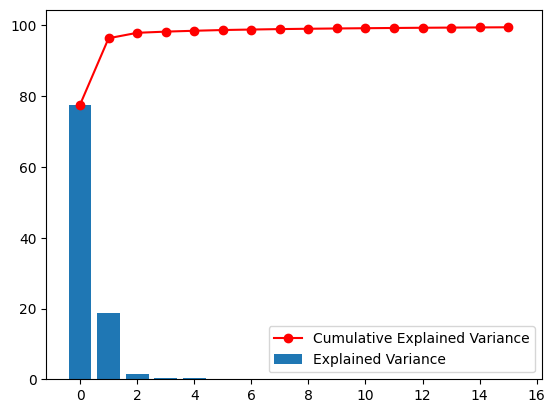

In [ ]:
#3)
import matplotlib.pyplot as plt
#Get sorted eigenvalues and eigenvectors
eigenvalues, eigenvectors=get_sorted_eigen(cov_matrix)

#print(eigenvalues)

eigenvalues_sum=np.sum(eigenvalues)

# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(eigenvalues) / eigenvalues_sum



eigValSum=sum(eigenvalues)
expVar=[eigV/eigValSum*100 for eigV in eigenvalues]
cumExpVar=np.cumsum(expVar)

#print(cumExpVar)

plt.bar(range(16), expVar[:16], label='Explained Variance')
plt.plot(cumExpVar[:16], 'r-o', label='Cumulative Explained Variance')
plt.legend()
plt.show()



In [ ]:
#4)

def find_num_PC(criteria, var_lst):
  for index in range(len(var_lst)):
    if cumulative_variance[index]>criteria:
      return index+1

num=find_num_PC(0.99, cumulative_variance)
print(f'we need {num} PCs to cover 99% of the variance of the dataset')

we need 9 PCs to cover 99% of the variance of the dataset


In [ ]:
first_16_components = eigenvectors[:16]

In [ ]:
def set_x_space(num_ticks):
  tick_positions = np.linspace(0, len(df.columns)-1, num_ticks, dtype=int)
  return tick_positions

In [ ]:
tick_positions=set_x_space(10)

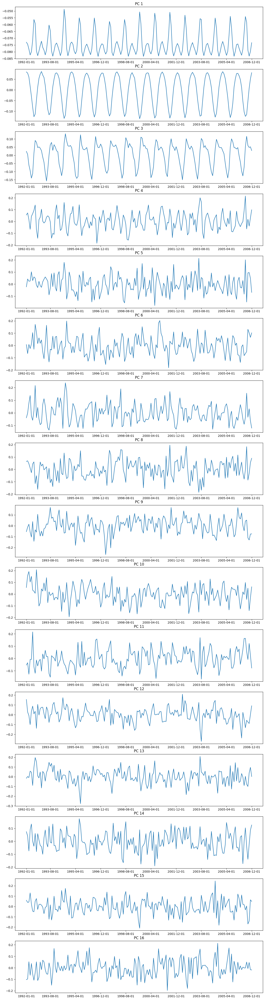

In [ ]:
#5)
df=pd.DataFrame(eigenvectors, columns=data_raw.columns)


#Select the first 16 principal components
first_16_components = eigenvectors.T[:16]


fig, axes=plt.subplots(16, 1, figsize=(15, 60))

for i in range(16):
  axes[i].plot(df.columns, first_16_components[i])
  axes[i].set_title(f'PC {i+1}')

  axes[i].set_xticks(tick_positions)

plt.show()

The first two PCs are very regular in t he fluctuations of the graph. Others are more random.

# Part 3: Data reconstruction [3 Marks]

Create a function that:

*   Accepts a city and the original dataset as inputs.
*   Calls useful functions that you designed in previous parts to compute eigenvectors and eigenvalues.
*   Plots 4 figures:
  1.   The original time-series for the specified city. **[0.5]**
  2.   The incremental reconstruction of the **original** (not standardized) time-series for the specified city in a single plot. **[1.5]**
       * You should at least show 5 curves in a figure for incremental reconstruction. For example, you can pick the following (or any other combination that you think is reasonable):
          * Reconstruction with only PC1
          * Reconstruction with both PC1 and PC2
          * Reconstruction with PC1 to PC4 (First 4 PCs)
          * Reconstruction with PC1 to PC8 (First 8 PCs)
          * Reconstruction with PC1 to PC16 (First 16 PCs)

      * Hint: you need to compute the reconstruction for the standardized time-series first, and then scale it back to the original (non-standardized form) using the StandardScaler `inverse_transform` [help...](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform)
  3.   The residual error for your best reconstruction with respect to the original time-series. **[0.5]**
      * Hint: You are plotting the error that we have for reconstructing each month `(df - df_reconstructed)`. On the x-axis, you have dates, and on the y-axis, the residual error.
  4.   The RMSE of the reconstruction as a function of the number of included components (x-axis is the number of components and y-axis is the RMSE). Sweep x-axis from 1 to 10 (this part is independent from part 3.2.) **[1]**

Test your function using the `Yakeshi`, `Zamboanga`, `Norilsk`, `Juliaca`, and `Doha` as inputs. **[0.5]**


In [ ]:
from sklearn.preprocessing import StandardScaler
import sys
from sklearn.metrics import mean_squared_error
def plot_city_figures_pca(original_df, city_name):
  eigenvalues_pca, eigenvectors_pca=get_sorted_eigen(cov_matrix)
  fig, axes=plt.subplots(4, 1, figsize=(15, 30))
  #1. plot the original time-series for the specified city
  x=original_df.columns
  y=original_df.loc[city_name]
  axes[0].plot(x, y)
  axes[0].set_title((f"The original time-series ({city_name})"))

  axes[0].set_xticks(tick_positions)


  #2. The incremental reconstruction of the original time-series for the speicified city
  scaler=StandardScaler().fit(original_df)
  data_scaled=scaler.transform(original_df)
  col_names=original_df.columns
  row_names=original_df.index
  rec_PC_index=[1, 2, 4, 8, 16]
  df_scaled=pd.DataFrame(data=data_scaled, columns=col_names, index=row_names)
  target_city_val=df_scaled.loc[city_name].values.reshape(1,-1)
  #show the five curves
  for i in rec_PC_index:
    W=eigenvectors_pca[:, 0:i]
    projection=np.dot(target_city_val, W)
    rec=scaler.inverse_transform(np.dot(projection, W.T))



    axes[1].plot(x, rec[0], label=f'{i} PCs')

    axes[1].set_xticks(tick_positions)
    axes[1].set_title((f"The incremental reconstruction of the original time-series ({city_name}) (PCA)"))
    axes[1].legend()

  #3. The residual error for your best reconstruction with respect to the original time-series.
  best_num_PC=0
  best_RMSE=sys.float_info.max
  for i in rec_PC_index: # find the best number of PCs
    W=eigenvectors_pca[:, 0:i]
    projection=np.dot(target_city_val, W)
    rec=scaler.inverse_transform(np.dot(projection, W.T))

    cur_RMSE=np.sqrt(mean_squared_error(y, rec[0]))
    if cur_RMSE<best_RMSE:
      best_RMSE=cur_RMSE
      best_num_PC=i


  W=eigenvectors_pca[:, 0:best_num_PC]
  projection=np.dot(target_city_val, W)
  rec=scaler.inverse_transform(np.dot(projection, W.T))

  residual_error=y-rec[0]

  axes[2].plot(x, residual_error, label=f'{best_num_PC} PCs')

  axes[2].set_xticks(tick_positions)
  axes[2].set_title((f"Residual error for the best reconstruction ({city_name}) (PCA)"))
  axes[2].legend()

  #4. The RMSE of the reconstruction as a function of the number of included components
  RMSE_list=[]
  for i in range(1, 11):
    W=eigenvectors_pca[:, 0:i]
    projection=np.dot(target_city_val, W)
    rec=scaler.inverse_transform(np.dot(projection, W.T))


    RMSE=np.sqrt(mean_squared_error(y, rec[0]))
    RMSE_list.append(RMSE)

  axes[3].plot(range(1, 11), RMSE_list)
  axes[3].set_title((f"RMSE vs. number of PCs ({city_name}) (PCA)"))





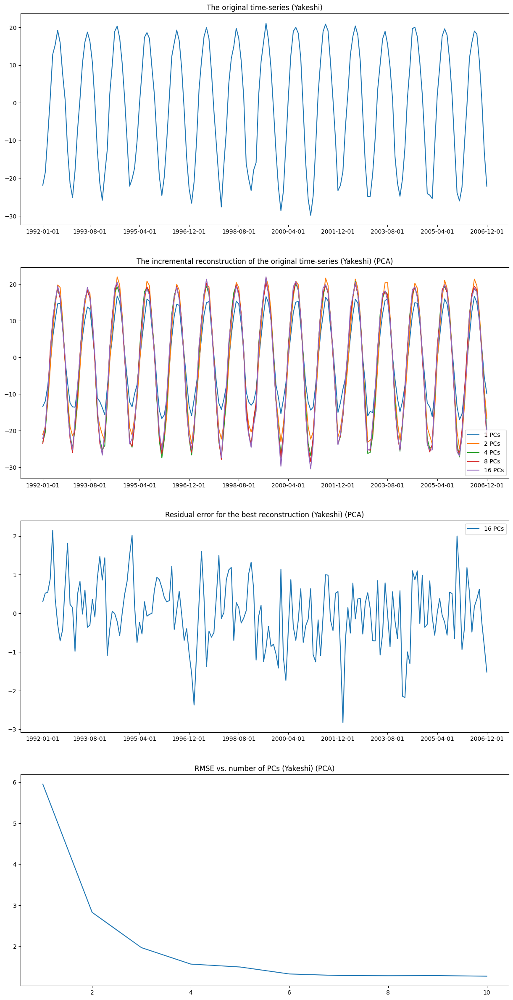

In [ ]:
plot_city_figures_pca(data_raw, 'Yakeshi')

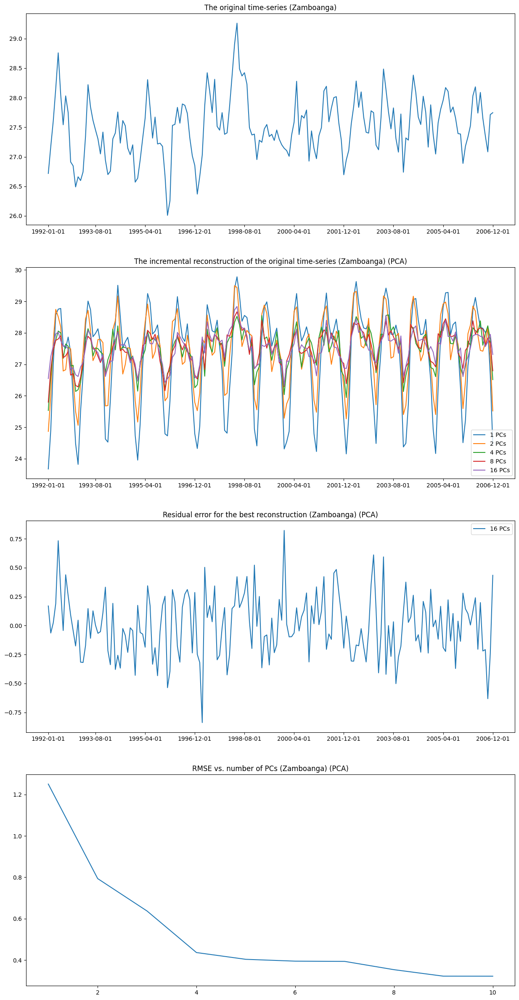

In [ ]:
plot_city_figures_pca(data_raw, 'Zamboanga')

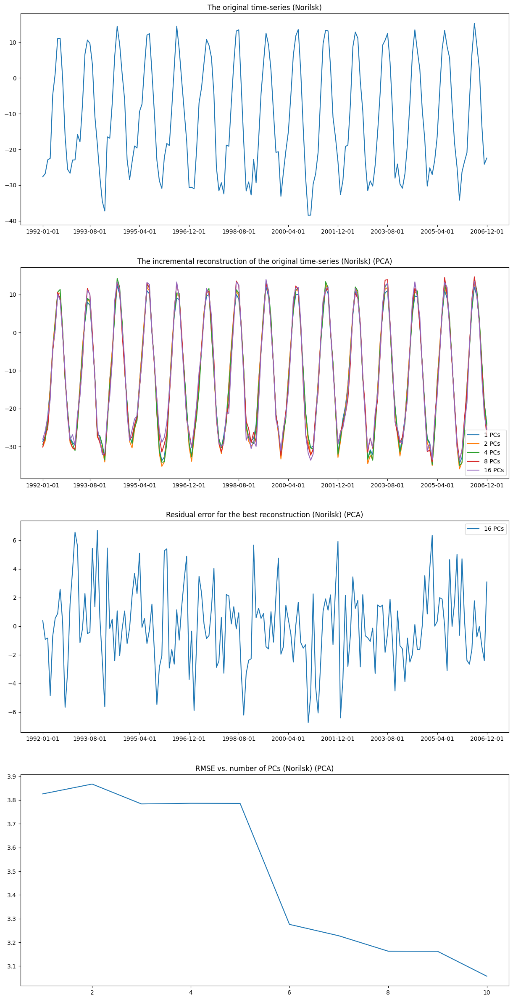

In [ ]:
plot_city_figures_pca(data_raw, 'Norilsk')

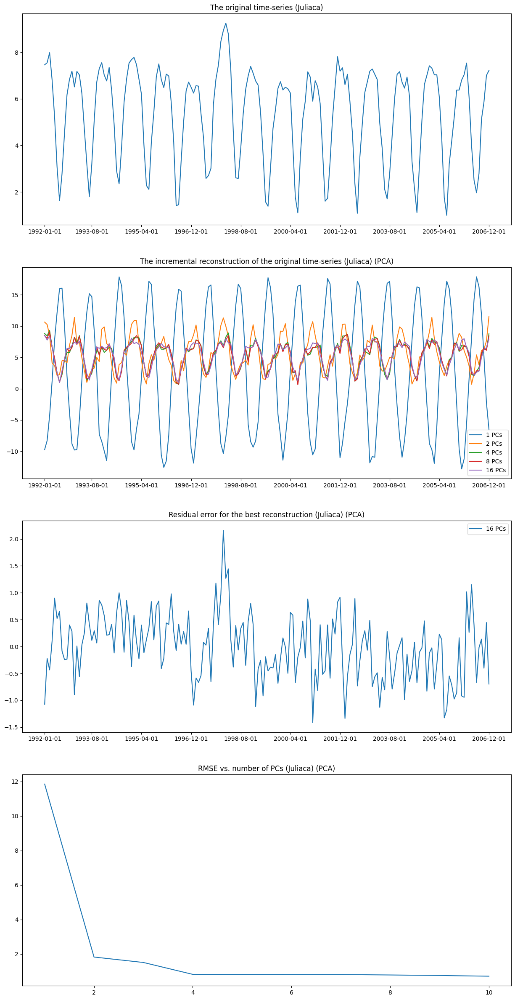

In [ ]:
plot_city_figures_pca(data_raw, 'Juliaca')

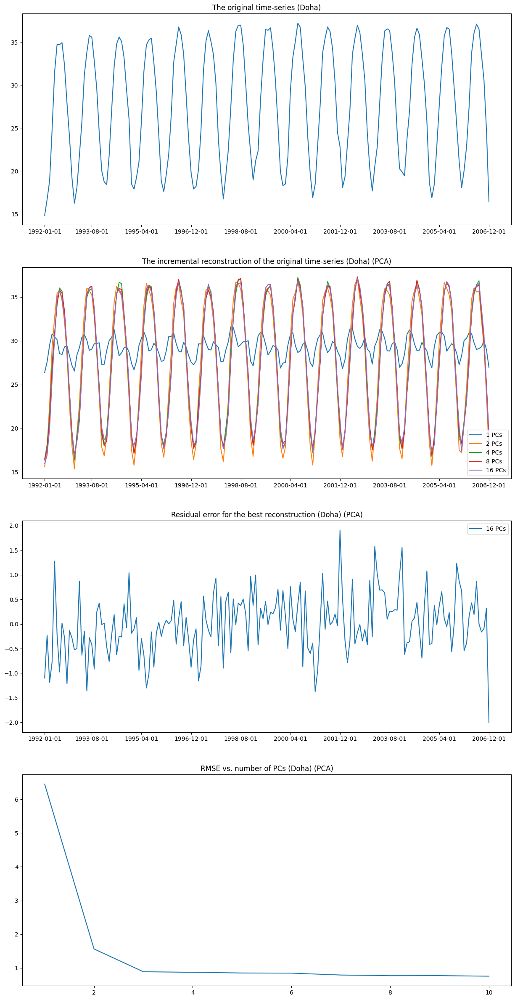

In [ ]:
plot_city_figures_pca(data_raw, 'Doha')

# Part 4: SVD [2 Marks]
Modify your code in part 3 to use SVD instead of PCA for extracting the eigenvectors. **[1]**

Explain if standardization or covariance computation is required for this part.
Repeat part 3 and compare your PCA and SVD results. Write a function to make this comparison **[0.5]**, and comment on the results. **[0.5]**.

In [ ]:
def plot_city_figures_svd(original_df, city_name):

  fig, axes=plt.subplots(4, 1, figsize=(15, 30))
  #1. plot the original time-series for the specified city
  x=original_df.columns
  y=original_df.loc[city_name]
  axes[0].plot(x, y)
  axes[0].set_title((f"The original time-series ({city_name})"))

  axes[0].set_xticks(tick_positions)


  #2. The incremental reconstruction of the original time-series for the speicified city
  scaler=StandardScaler().fit(original_df)
  data_scaled=scaler.transform(original_df)
  col_names=original_df.columns
  row_names=original_df.index
  rec_PC_index=[1, 2, 4, 8, 16]



  U, S, V = np.linalg.svd(data_scaled, full_matrices=True) # extracting the eigenvectors using svd


  #show the five curves
  for i in rec_PC_index:

    rec=scaler.inverse_transform(np.dot(np.dot(U[:, :i],
                  np.diag(S[:i])),
                V[:i, :]))
    new_df=pd.DataFrame(data=rec, columns=col_names, index=row_names)


    axes[1].plot(x, new_df.loc[city_name], label=f'{i} PCs')

    axes[1].set_xticks(tick_positions)
    axes[1].set_title((f"The incremental reconstruction of the original time-series ({city_name}) (SVD)"))
    axes[1].legend()

  #3. The residual error for your best reconstruction with respect to the original time-series.
  best_num_PC=0
  best_RMSE=sys.float_info.max
  for i in rec_PC_index: # find the best number of PCs


    rec=scaler.inverse_transform(np.dot(np.dot(U[:, :i],
                  np.diag(S[:i])),
                V[:i, :]))
    new_df=pd.DataFrame(data=rec, columns=col_names, index=row_names)
    cur_RMSE=np.sqrt(mean_squared_error(y, new_df.loc[city_name]))
    if cur_RMSE<best_RMSE:
      best_RMSE=cur_RMSE
      best_num_PC=i



  rec=scaler.inverse_transform(np.dot(np.dot(U[:, :best_num_PC],
                  np.diag(S[:best_num_PC])),
                V[:best_num_PC, :]))
  new_df=pd.DataFrame(data=rec, columns=col_names, index=row_names)
  residual_error=y-new_df.loc[city_name]

  axes[2].plot(x, residual_error, label=f'{best_num_PC} PCs')

  axes[2].set_xticks(tick_positions)
  axes[2].set_title((f"Residual error for the best reconstruction ({city_name}) (SVD)"))
  axes[2].legend()

  #4. The RMSE of the reconstruction as a function of the number of included components
  RMSE_list=[]
  for i in range(1, 11):

    rec=scaler.inverse_transform(np.dot(np.dot(U[:, :i],
                  np.diag(S[:i])),
                V[:i, :]))
    new_df=pd.DataFrame(data=rec, columns=col_names, index=row_names)

    RMSE=np.sqrt(mean_squared_error(y, new_df.loc[city_name]))
    RMSE_list.append(RMSE)

  axes[3].plot(range(1, 11), RMSE_list)
  axes[3].set_title((f"RMSE Vvs. number of PCs ({city_name}) (SVD)"))



Covariance computation is not required as SVD does not explicitly compute the covariance matrix, It directly decomposes the data matrix.

Standardization is not required as SVD is not based on the covariance matrix.

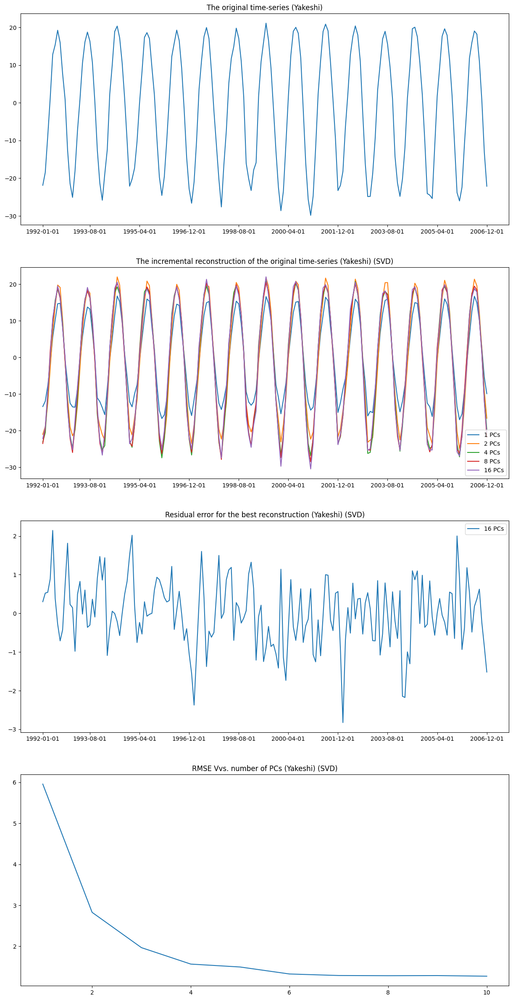

In [ ]:
plot_city_figures_svd(data_raw, 'Yakeshi')

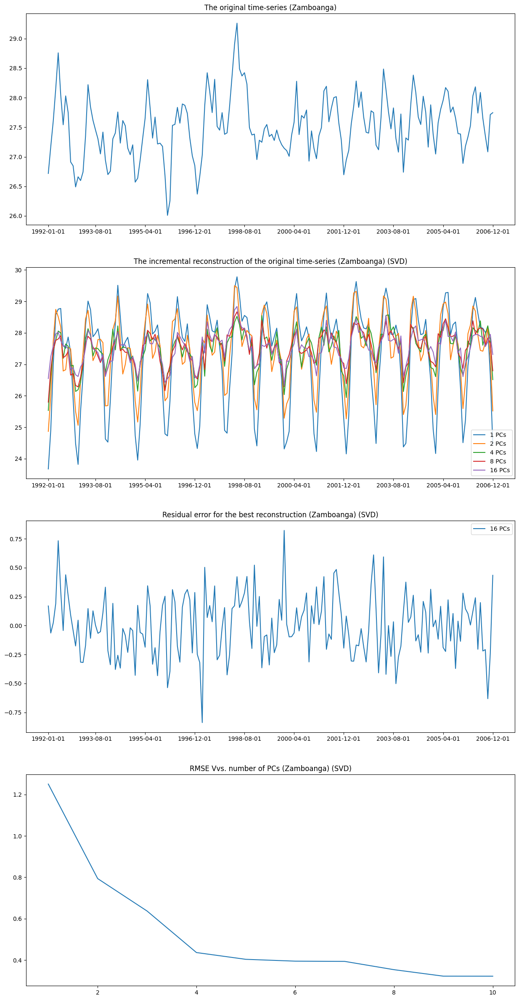

In [ ]:
plot_city_figures_svd(data_raw, 'Zamboanga')

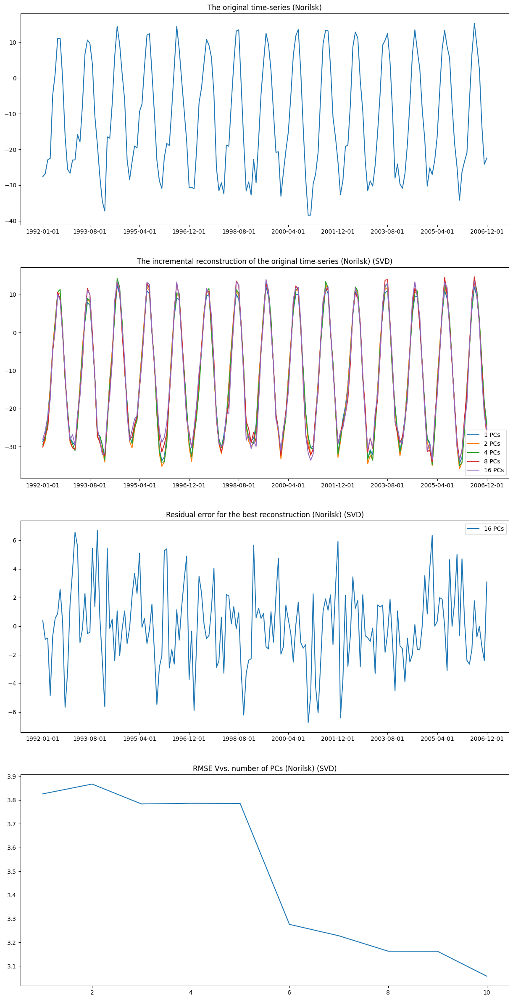

In [ ]:
plot_city_figures_svd(data_raw, 'Norilsk')

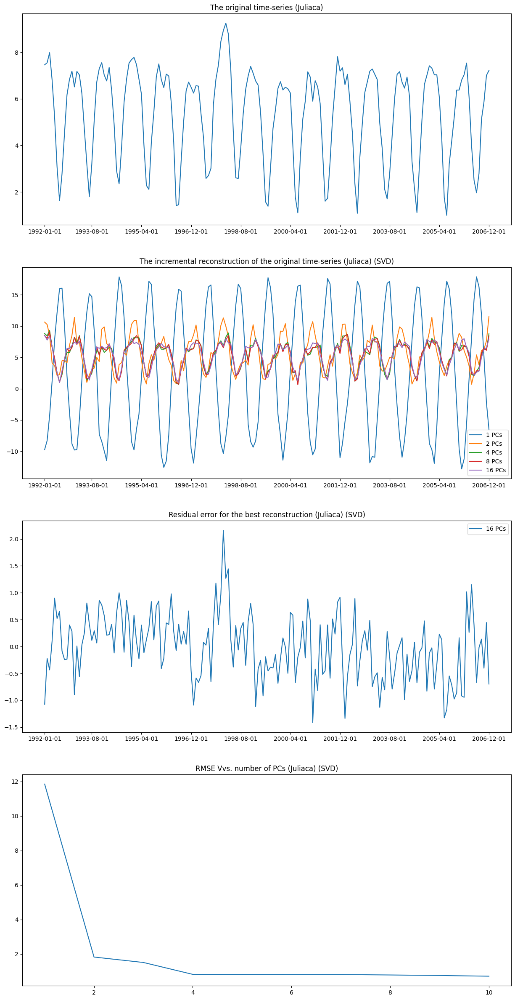

In [ ]:
plot_city_figures_svd(data_raw, 'Juliaca')

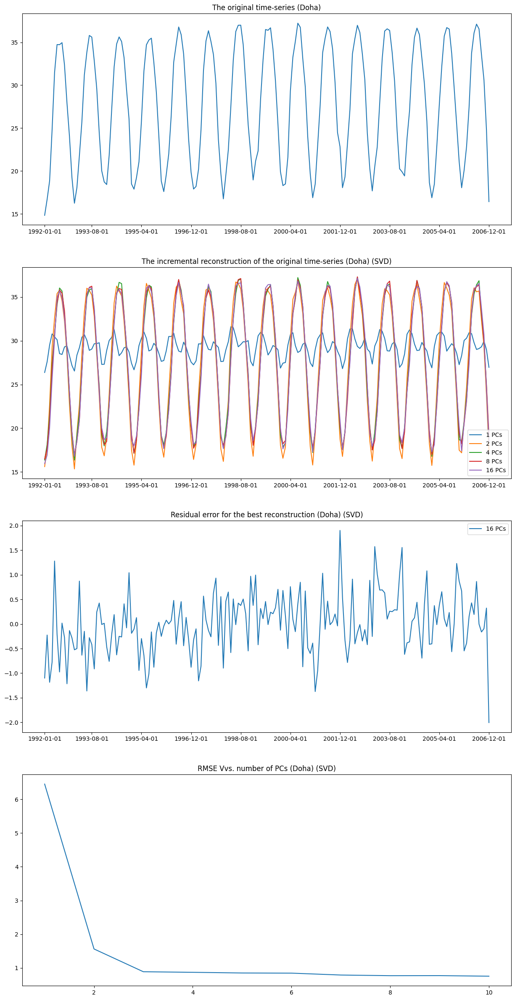

In [ ]:
plot_city_figures_svd(data_raw, 'Doha')

In [ ]:
def compare_pca_svd(original_df, city_name):

  fig, axes=plt.subplots(4, 1, figsize=(15, 30))
  #1. plot the original time-series for the specified city
  x=original_df.columns
  y=original_df.loc[city_name]
  axes[0].plot(x, y)
  axes[0].set_title((f"The original time-series ({city_name})"))

  axes[0].set_xticks(tick_positions)


  #2. The incremental reconstruction of the original time-series for the speicified city
  scaler=StandardScaler().fit(original_df)
  data_scaled=scaler.transform(original_df)
  col_names=original_df.columns
  row_names=original_df.index
  rec_PC_index=[1, 2, 4, 8, 16]
  df_scaled=pd.DataFrame(data=data_scaled, columns=col_names, index=row_names)
  target_city_val=df_scaled.loc[city_name].values.reshape(1,-1)

  cov_matrix_pca=np.cov(data_scaled.T)

  eigenvalues_pca, eigenvectors_pca=get_sorted_eigen(cov_matrix_pca)

  U, S, V = np.linalg.svd(data_scaled, full_matrices=True) # extracting the eigenvectors using svd

  #show the five curves
  for i in rec_PC_index:

    W=eigenvectors_pca[:, 0:i]

    projection=np.dot(target_city_val, W)

    rec_pca=scaler.inverse_transform(np.dot(projection, W.T))

    rec_svd=scaler.inverse_transform(np.dot(np.dot(U[:, :i],
                  np.diag(S[:i])),
                V[:i, :]))
    new_df=pd.DataFrame(data=rec_svd, columns=col_names, index=row_names)




    axes[1].plot(x, rec_pca[0], label=f'{i} PCs (PCA)')
    axes[1].plot(x, new_df.loc[city_name], label=f'{i} PCs (SVD)')

    axes[1].set_xticks(tick_positions)
    axes[1].set_title((f"The incremental reconstruction of the original time-series ({city_name}) (PCA vs. SVD)"))
    axes[1].legend()

  #3. The residual error for your best reconstruction with respect to the original time-series.
  best_num_PC_pca=0
  best_num_PC_svd=0
  best_RMSE_pca=sys.float_info.max
  best_RMSE_svd=sys.float_info.max
  for i in rec_PC_index: # find the best number of PCs
    W=eigenvectors_pca[:, 0:i]
    projection=np.dot(target_city_val, W)
    rec_pca=scaler.inverse_transform(np.dot(projection, W.T))
    rec_svd=scaler.inverse_transform(np.dot(np.dot(U[:, :i],
                  np.diag(S[:i])),
                V[:i, :]))
    new_df=pd.DataFrame(data=rec_svd, columns=col_names, index=row_names)


    cur_RMSE_pca=np.sqrt(mean_squared_error(y, rec_pca[0]))
    cur_RMSE_svd=np.sqrt(mean_squared_error(y, new_df.loc[city_name]))
    if cur_RMSE_pca<best_RMSE_pca:
      best_RMSE_pca=cur_RMSE_pca
      best_num_PC_pca=i

    if cur_RMSE_svd<best_RMSE_svd:
      best_RMSE_svd=cur_RMSE_svd
      best_num_PC_svd=i


  W=eigenvectors_pca[:, 0:best_num_PC_pca]
  projection=np.dot(target_city_val, W)
  rec_pca=scaler.inverse_transform(np.dot(projection, W.T))

  rec_svd=scaler.inverse_transform(np.dot(np.dot(U[:, :best_num_PC_svd],
                  np.diag(S[:best_num_PC_svd])),
                V[:best_num_PC_svd, :]))

  new_df=pd.DataFrame(data=rec_svd, columns=col_names, index=row_names)

  residual_error_pca=y-rec_pca[0]
  residual_error_svd=y-new_df.loc[city_name]

  axes[2].plot(x, residual_error_pca, label=f'{best_num_PC_pca} PCs (PCA)')
  axes[2].plot(x, residual_error_svd, label=f'{best_num_PC_svd} PCs (SVD)')

  axes[2].set_xticks(tick_positions)
  axes[2].set_title((f"Residual error for the best reconstruction ({city_name}) (PCA vs. SVD)"))
  axes[2].legend()

  #4. The RMSE of the reconstruction as a function of the number of included components
  RMSE_list_pca=[]
  RMSE_list_svd=[]
  for i in range(1, 11):
    W=eigenvectors_pca[:, 0:i]
    projection=np.dot(target_city_val, W)
    rec_pca=scaler.inverse_transform(np.dot(projection, W.T))
    rec_svd=scaler.inverse_transform(np.dot(np.dot(U[:, :i],
                  np.diag(S[:i])),
                V[:i, :]))
    new_df=pd.DataFrame(data=rec_svd, columns=col_names, index=row_names)
    RMSE_pca=np.sqrt(mean_squared_error(y, rec_pca[0]))
    RMSE_list_pca.append(RMSE_pca)

    RMSE_svd=np.sqrt(mean_squared_error(y, new_df.loc[city_name]))
    RMSE_list_svd.append(RMSE_svd)

  axes[3].plot(range(1, 11), RMSE_list_pca, label='RMSE for PCA')
  axes[3].plot(range(1, 11), RMSE_list_svd, label='RMSE for SVD')
  axes[3].set_title((f"RMSE vs. number of PCs ({city_name}) (PCA vs. SVD)"))
  axes[3].legend()





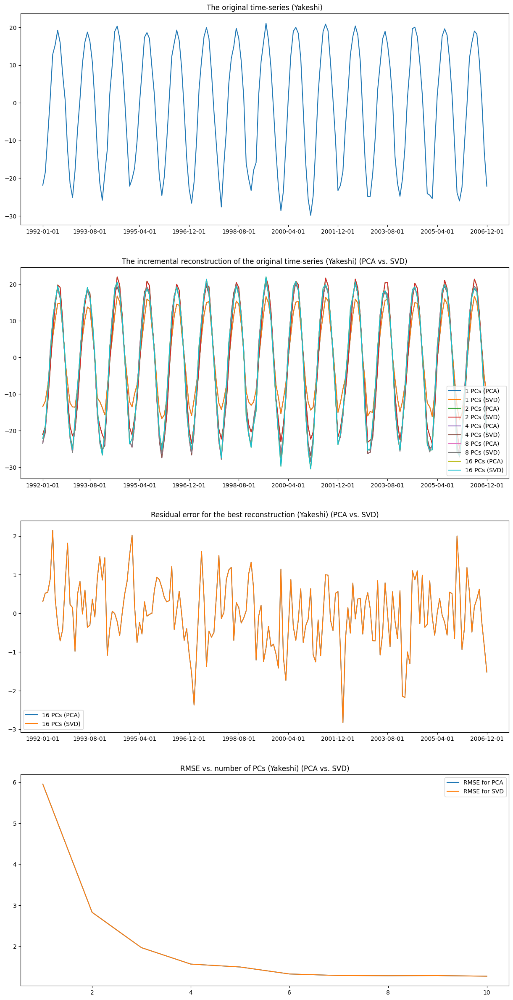

In [ ]:
compare_pca_svd(data_raw, 'Yakeshi')

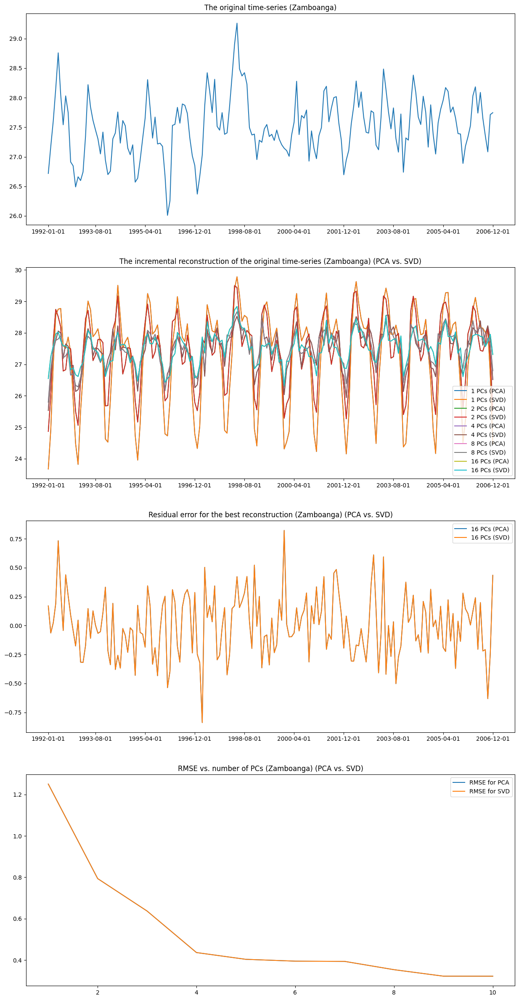

In [ ]:
compare_pca_svd(data_raw, 'Zamboanga')

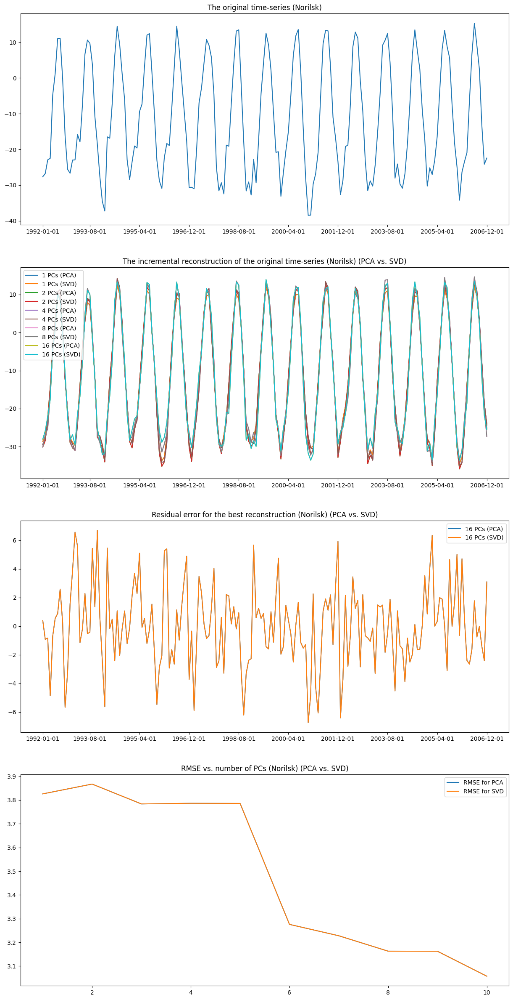

In [ ]:
compare_pca_svd(data_raw, 'Norilsk')

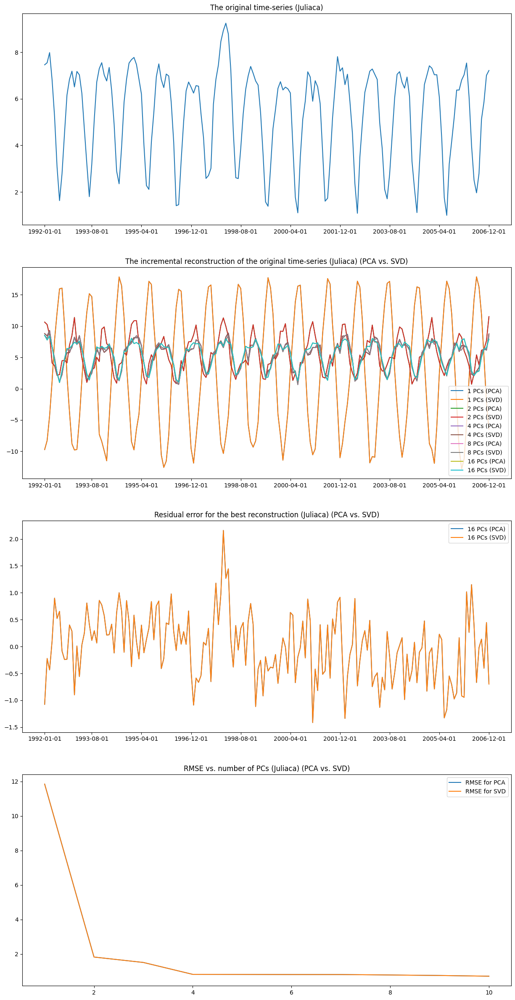

In [ ]:
compare_pca_svd(data_raw, 'Juliaca')

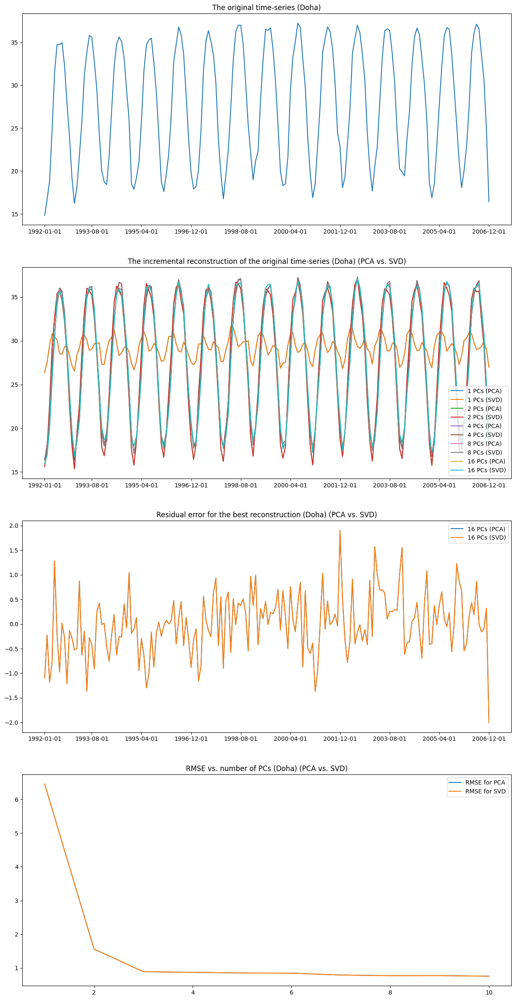

In [ ]:
compare_pca_svd(data_raw, 'Doha')

The result from PCA and SVD is almost the same based on the plots. The eigenvectors obtained from PCA and SVD is almost the same (only small difference in the value, can be ignored)

# Part 5: Let's collect another dataset! [2 Marks]
Create another dataset similar to the one provided in your handout using the raw information on average temperatures per states (not cities) provided [here](https://github.com/Sabaae/Dataset/blob/main/TemperaturesbyState.csv). **[1]**

You need to manipulate the data to organize it in the desired format (i.e., the same format that was in previous parts). If there is a missing value for the average temperature of a particular state at a given date, make sure to remove that date completely from the dataset, even if the data of that specific date exists for other states.

You are free to use any tools you like, from Excel to Python! In the end, you should have a new CSV file with more dates (features) compared to the provided dataset. How many features does the final dataset have? How many states are there?


Upload your new dataset (in CSV format) to your colab notebook and repeat part 4. When analyzing the states, you may use `Jilin`, `Nunavut`, `Rio Grande Do Norte`, `Louisiana`, and `Tasmania`. **[1]**


The code below helps you to upload your new CSV file to your colab session.

In [ ]:
# load train.csv to Google Colab
from google.colab import files
uploaded = files.upload()

In [ ]:
new_data = pd.read_csv(
    filepath_or_buffer='/content/TemperaturesbyState.csv',
    index_col=0
)


# Pivot the DataFrame
new_data_pivoted=new_data.pivot_table(index='State', columns='dt', values='AverageTemperature', aggfunc='mean')
new_data_pivoted.columns.name = None

#remove missing val
new_data_pivoted=new_data_pivoted.dropna(axis='columns')

new_data_pivoted.shape





(241, 608)

There are 241 states and 608 features.

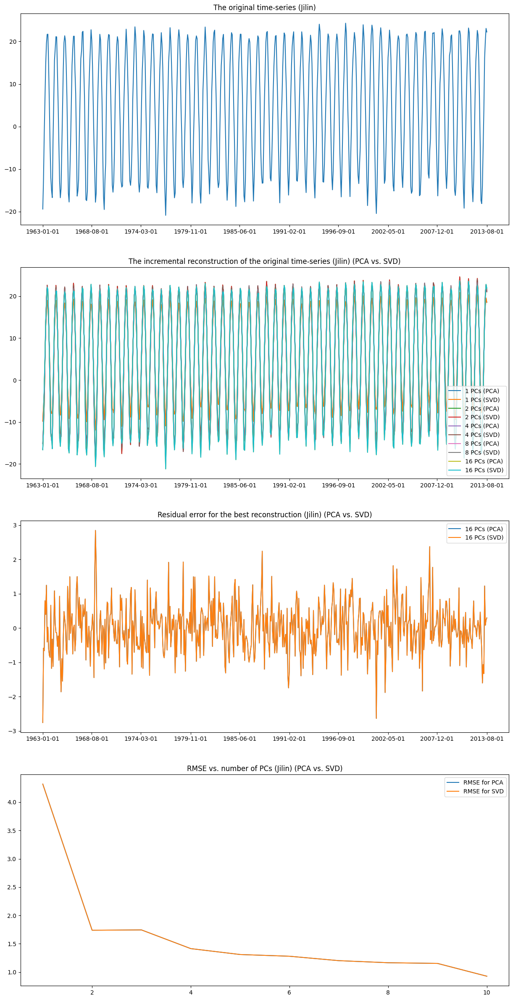

In [ ]:
compare_pca_svd(new_data_pivoted, 'Jilin')

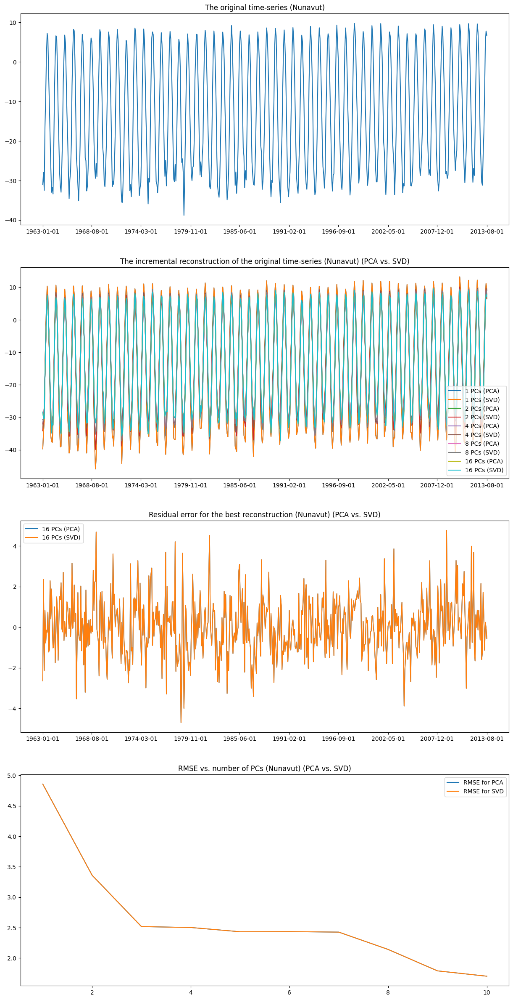

In [ ]:
compare_pca_svd(new_data_pivoted, 'Nunavut')

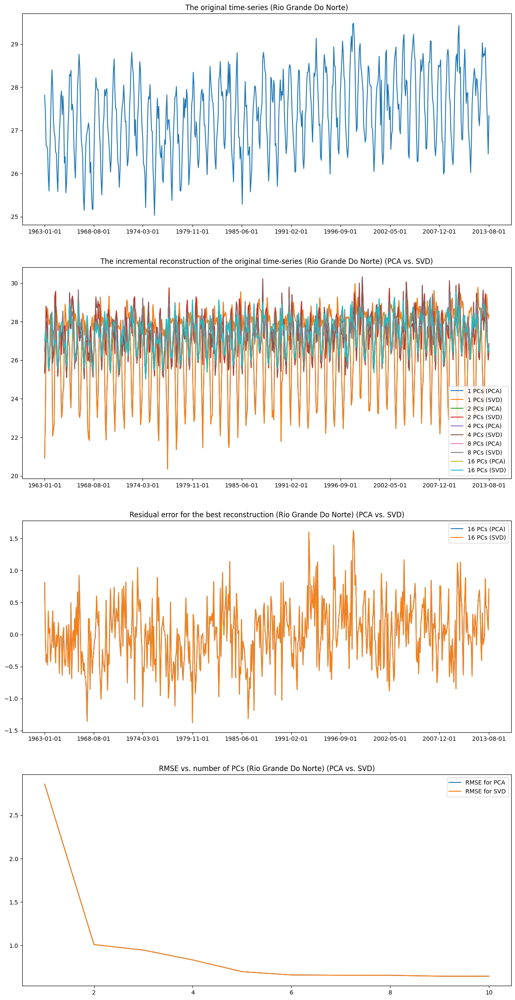

In [ ]:
compare_pca_svd(new_data_pivoted, 'Rio Grande Do Norte')

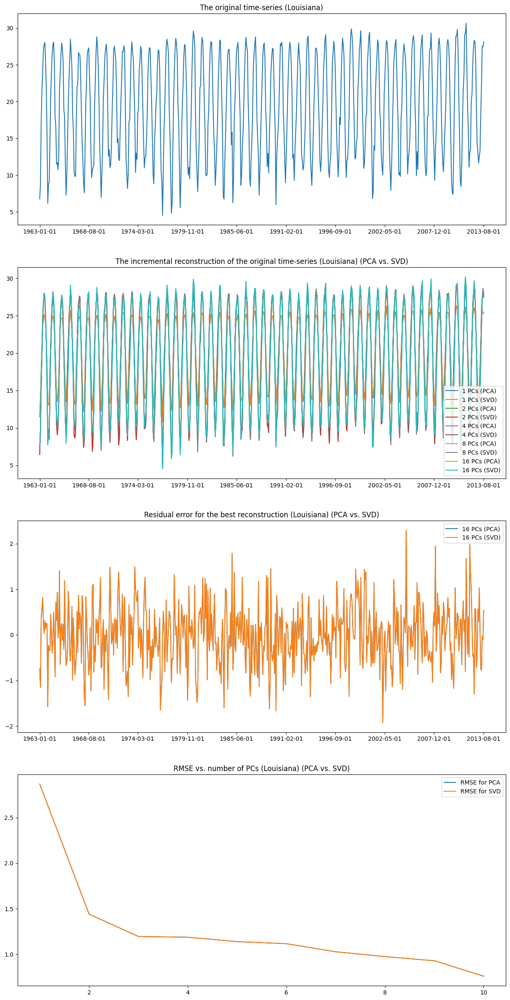

In [ ]:
compare_pca_svd(new_data_pivoted, 'Louisiana')

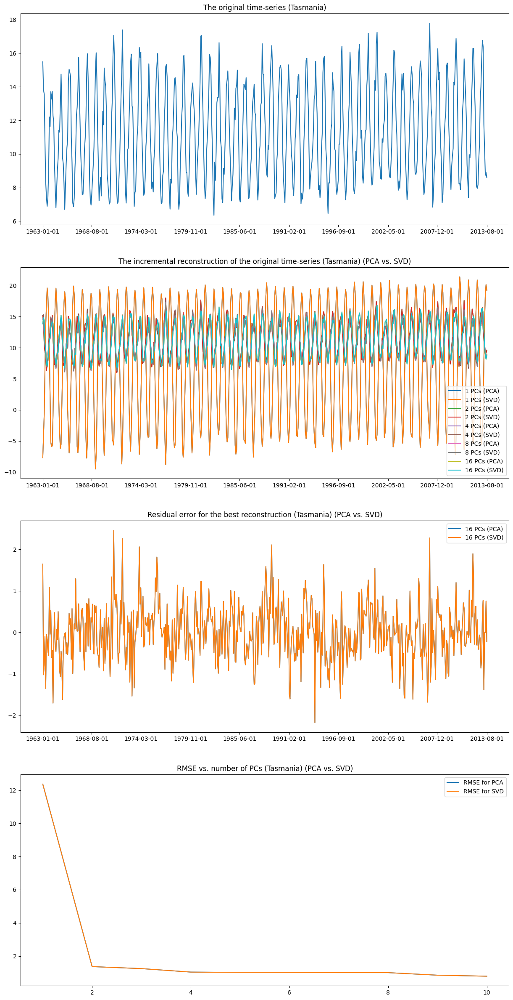

In [ ]:
compare_pca_svd(new_data_pivoted, 'Tasmania')

# References

Understanding PCA and SVD:

1. https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

2. https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

3. https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues

4. https://hadrienj.github.io/posts/Deep-Learning-Book-Series-2.8-Singular-Value-Decomposition/

PCA:

1. Snippets from: https://plot.ly/ipython-notebooks/principal-component-analysis/

2. https://www.value-at-risk.net/principal-component-analysis/

Temperature Data:

1. https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data

2. https://berkeleyearth.org/data/

